In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from jax import vmap, jit
import jax.numpy as jnp
from pathlib import Path
import numpy as np
from einops import rearrange
import jax
import matplotlib.pyplot as plt
import seaborn as sns
from hflow.misc.plot import scatter_movie, imshow_movie
import random

In [164]:
from hflow.data.vlasov import run_vlasov
from hflow.misc.misc import (gauss_quadrature_weights_points,
                             pts_array_from_space)
from hflow.train.sample import interplate_in_t
from hflow.data.utils import normalize


n_samples = 10_000
n_t = 1000
t0, t1 = 0, 40
t_eval = np.linspace(t0, t1, n_t)
mu = 1.3
sols = run_vlasov(n_samples, t_eval, mu, mode='two-stream')



t_train = t_eval / t_eval[-1]
t_train = t_train.reshape(-1, 1)
# g_pts_01, quad_weights = gauss_quadrature_weights_points(
#     bs_t, a=0.0, b=1.0)

# start, end = jnp.asarray([0]), jnp.asarray([1.0])
# g_pts_01 = jnp.concatenate([start, g_pts_01, end])

# sols = rearrange(np.expand_dims(sols, 0), 'M T N D -> T M N D')
# # interp
# sols = interplate_in_t(sols, t_train, g_pts_01)
# sols = rearrange(sols, 'T M N D -> (T M) N D')

# t_train = g_pts_01.reshape(-1,1)
sols, d_shift, d_scale = normalize(
    sols, axis=(0, 1), return_stats=True, method='01')
sols = jnp.expand_dims(sols, axis=0)
scatter_movie(sols[0], alpha=0.1)


In [173]:
from hflow.net.build import build_colora
from typing import List, Optional

import jax.numpy as jnp
from jax.flatten_util import ravel_pytree

from hflow.net.networks import DNN
from hflow.net.utils import init_net, merge, split

key = jax.random.PRNGKey(random.randint(0,1e8))

M = 1
x_dim = 2
mu_t_dim = 1
u_dim = 2

net_u = DNN(width=128, layers=['D']*7, out_dim=u_dim, period=None)
params_init, u_apply = init_net(net_u, x_dim+2+M, key=key) # x, t, mu, sigma

def s(t, x, mu, sigma, params):
    t = jnp.squeeze(t)
    x = jnp.squeeze(x)
    mu = jnp.squeeze(mu)
    sigma = jnp.squeeze(sigma)
    x_t = jnp.concatenate([ jnp.array([t]), 
                            x, 
                            jnp.array([mu]), 
                            jnp.array([sigma]) ])
    return jnp.squeeze(u_apply(params, x_t))

score_Vx = vmap(s, (None, 0, None, None, None))

In [174]:
D = 2

In [175]:

def score_match(x, t, mu, sigma, params):
    
    seed = jnp.linalg.norm(x)*jnp.linalg.norm(t)*jnp.linalg.norm(sigma)*jnp.linalg.norm(sigma)*1e7
    key = jax.random.PRNGKey(seed.astype(int))
    y = jax.random.normal(key, shape=x.shape)
  
    x_tilde = x + sigma * y

    mu = jnp.array([mu])
    l = sigma**2 * 0.5 * jnp.sum( ( s(t, x_tilde, mu, sigma, params) + (x_tilde - x)/sigma**2 )**2 )
    return l



In [176]:
from jax.experimental.host_callback import id_print, id_tap

import jax.flatten_util

def ncsm_loss(params, x_t_batch, mu, t_batch, key):

    one, T, N, D = x_t_batch.shape
    T, one = t_batch.shape
    
    x_t_batch = jnp.squeeze(x_t_batch) # T N D
    
    # append noise
    xt_tensor = rearrange(x_t_batch, 'T N D -> T (N D)')
    xt_tensor = jnp.hstack([xt_tensor, t_batch]) # T (2ND + 1)

    def vX_VT_score_match(xt_tensor, sigma):
        x_batch, t = xt_tensor[:-one], xt_tensor[-one:]
        x_batch = rearrange(x_batch, '(N D) -> N D', D=D) # N 2D when vmapped over t
        print(x_batch.shape)
        sm = vmap(score_match, (0, None, None, None, None))(x_batch, t, mu, sigma, params)
        return sm.mean() # mean over N
    
    # annealing schedule: sigmas
    start = 1
    end = 1e-2
    L = 10
    sigmas = jnp.array([start * (end / start) ** (i / (L - 1)) for i in range(L)])
    
    vX_VT_score_match = vmap(vX_VT_score_match, (0, None))
    vX_VT_score_match = vmap(vX_VT_score_match, (None, 0))
    
    score = vX_VT_score_match(xt_tensor, sigmas)
    
    #loss = 0
    #for sigma in sigmas:
    #    score = vmap(vX_VT_score_match, (0, None))(xyt_tensor, sigma)
    #    loss += score.mean() / L

    return score.mean() 


def get_rand_idx(key, N, bs):
    idx = jnp.arange(0, N)
    return jax.random.choice(key, idx, shape=(bs,), replace=False)


def get_data_fn(sols, mu_data, t_data, bs_n, bs_t, bs_m):
    M, T, N, D = sols.shape

    def args_fn(key, *args):

        nonlocal sols
        nonlocal t_data
        keyn, keym, keyt = jax.random.split(key, num=3)

        m_idx = get_rand_idx(keym, M, bs_m)
        mu_sample = mu_data[m_idx] # M
        sols_sample = sols[m_idx] # bs_m x T x N x D
        
        t_idx = get_rand_idx(keyt, T, bs_t)
        #keys = jax.random.split(keyn, num=bs_t)
        #sample_idx = vmap(get_rand_idx, (0, None, None))(keys, N, bs_n)

        sols_sample = sols[:, t_idx, :, :] # 1 x bs_t x N x D
        t_sample = t_data[t_idx]

        sample_idx = get_rand_idx(keyn, N, bs_n)
        #sols_sample = sols_sample[np.arange(len(sols_sample))[:, None], sample_idx]
        sols_sample = sols_sample[:, :, sample_idx, :]

        return sols_sample, mu_sample, t_sample
    
    return args_fn

In [177]:
bs_n = 256
bs_t = 64
bs_m = 1
t_train = (t_eval/t_eval[-1]).reshape(-1,1)
mu_train = jnp.zeros(1)
key = jax.random.PRNGKey(np.random.randint(0,1e5))
args_fn = get_data_fn(sols, mu_train, t_train, bs_n, bs_t, bs_m)
sols_sample, mu_sample, t_sample = args_fn(key)
sols_sample.shape, mu_sample.shape, t_sample.shape

((1, 64, 256, 2), (1,), (64, 1))

In [188]:
from hflow.train.adam import adam_opt

last_params, opt_params, loss_history, param_history = adam_opt(params_init, ncsm_loss, args_fn, steps=15_000, learning_rate=5e-3, verbose=True, scheduler=True, key=key, return_params=True)



  0%|          | 0/15000 [00:00<?, ?it/s]

(256, 2)


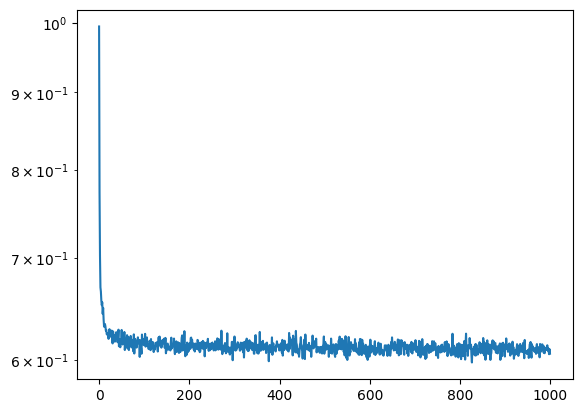

In [189]:
plt.semilogy(loss_history)
plt.show()

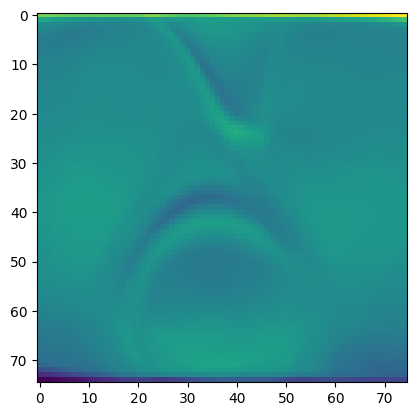

In [190]:
nx = 75

x1, x2 = jnp.linspace(0, 1, nx), jnp.linspace(0, 1, nx)
m_grids = jnp.meshgrid(x1, x2,  indexing='ij')
x_grid = jnp.asarray([m.flatten() for m in m_grids]).T

time = 1.0
sigma = 1e-2
pred = score_Vx(time, x_grid, mu_train, sigma, opt_params) 
pred = pred.reshape(nx,nx, 2)

plt.imshow(pred[:, :, 0])
plt.show()


In [191]:
L = 10
start = 1
end = 0.01
sigmas = jnp.array([start * (end / start) ** (i / (L - 1)) for i in range(L)])
#score_Vx = vmap(s, (None, 0, None, None, None))
def ald(key, mu, time, params):
    eps = 2e-5
    T = 10
    L = 10
    x = jax.random.normal(key, (1,D))
    xs = []
    for i in range(L):
        alpha = eps * sigmas[i]**2/sigmas[-1]**2
        for t in range(T):
            key, subkey = jax.random.split(key)
            z = jax.random.normal(subkey, x.shape)
            xs.append(x)
            x = x + alpha * 0.5 * score_Vx(time, x, mu, sigmas[i], params)  + jnp.sqrt(alpha) * z
    return x
#s(t, x, mu, sigma, params)
ald_vmap = vmap(ald, (0, None, None, None))
ald_vmap_time = vmap(ald_vmap, (None, None, 0, None))




In [192]:
keys = jax.random.split(key, 4000)
t_test = jnp.linspace(0.0, 1.0, 50)
xT = ald_vmap_time(keys, jnp.zeros(1), t_test, opt_params)
xT = jnp.squeeze(xT)
# xT = rearrange(xT, 'N T D -> T N D')

In [193]:
scatter_movie(xT)

In [194]:
from hflow.test.plot import get_hist

H = get_hist(xT)
imshow_movie(H)